# Disentanglix development

## Testing with real data

In [1]:
import autoencodix as acx
from autoencodix.data.datapackage import DataPackage
from autoencodix.configs.default_config import DataCase
from autoencodix.configs.disentanglix_config import DisentanglixConfig
import pandas as pd

df_rna = pd.read_parquet("./input_data_test/scRNA_human_cortex_formatted.parquet")
df_meth = pd.read_parquet("./input_data_test/scATAC_human_cortex_formatted.parquet")
df_anno = pd.read_parquet("./input_data_test/scATAC_human_cortex_clinical_formatted.parquet")

data_package = DataPackage()
data_package.multi_bulk = {"transcriptomics": df_rna, "epigenetic": df_meth}
data_package.annotation = {
	"paired": df_anno.copy(),
}


my_cfg = DisentanglixConfig(
	data_case=DataCase.MULTI_BULK,
	loss_reduction="sum",
	k_filter=2000,
	latent_dim=2,
	scaling="STANDARD",
	# filtering="VAR", ## Setting globally not possible anymore
	epochs=200,
	learning_rate=0.0001,
	batch_size = 512,
	beta_mi = 1,
	beta_tc = 3000,
	beta_dimKL= 0.5,
	use_mss = True,
	drop_p =0.1,
	global_seed=42,
	checkpoint_interval=10,
	n_layers=1)

In [2]:
disent = acx.Disentanglix(data=data_package, config=my_cfg)


in handle_direct_user_data with data: <class 'autoencodix.data.datapackage.DataPackage'>


In [3]:
disent.run()

--- Running Pairing-Aware Split ---
Identified 24437 fully paired samples across all modalities.
Identified 0 samples present in at least one, but not all, modalities.
Successfully generated synchronized indices for all modalities.
cur shape: transcriptomics: (17105, 1000)
cur shape: epigenetic: (17105, 1000)
cur shape: transcriptomics: (4888, 1000)
cur shape: epigenetic: (4888, 1000)
cur shape: transcriptomics: (2444, 1000)
cur shape: epigenetic: (2444, 1000)
Training ...
Epoch 1 - Train Loss: 36566351.4062
Sub-losses: recon_loss: 36566085.8750, mut_info_loss: 0.6852, tot_corr_loss: 263.5409, dimwise_kl_loss: 2.1352, anneal_factor: 0.0000, effective_beta_mi_factor: 0.0000, effective_beta_tc_factor: 0.1362, effective_beta_dimKL_factor: 0.0000
Epoch 1 - Valid Loss: 4624188.5000
Sub-losses: recon_loss: 4624105.6250, mut_info_loss: 0.1450, tot_corr_loss: 81.8391, dimwise_kl_loss: 0.9887, anneal_factor: 0.0000, effective_beta_mi_factor: 0.0000, effective_beta_tc_factor: 0.1362, effective_b

Result Object Public Attributes:
------------------------------
latentspaces: TrainingDynamics object
sample_ids: TrainingDynamics object
reconstructions: TrainingDynamics object
mus: TrainingDynamics object
sigmas: TrainingDynamics object
losses: TrainingDynamics object
sub_losses: LossRegistry(_losses={'recon_loss': TrainingDynamics(), 'mut_info_loss': TrainingDynamics(), 'tot_corr_loss': TrainingDynamics(), 'dimwise_kl_loss': TrainingDynamics(), 'anneal_factor': TrainingDynamics(), 'effective_beta_mi_factor': TrainingDynamics(), 'effective_beta_tc_factor': TrainingDynamics(), 'effective_beta_dimKL_factor': TrainingDynamics()})
preprocessed_data: Tensor of shape (0,)
model: VarixArchitecture
model_checkpoints: TrainingDynamics object
datasets: DatasetContainer(train=<autoencodix.data._numeric_dataset.NumericDataset object at 0x76be047bc250>, valid=<autoencodix.data._numeric_dataset.NumericDataset object at 0x76be047bdd50>, test=<autoencodix.data._numeric_dataset.NumericDataset object

Creating plots ...


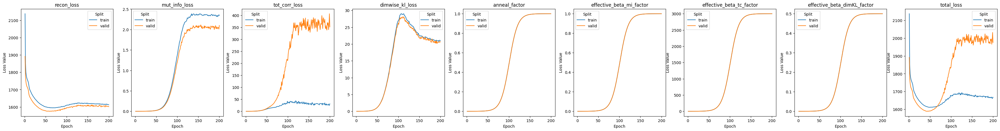

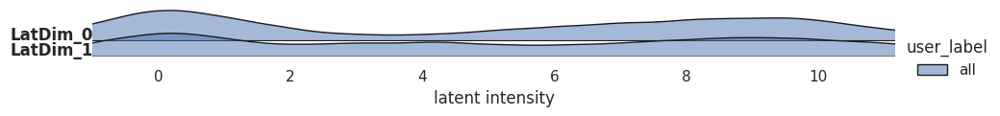

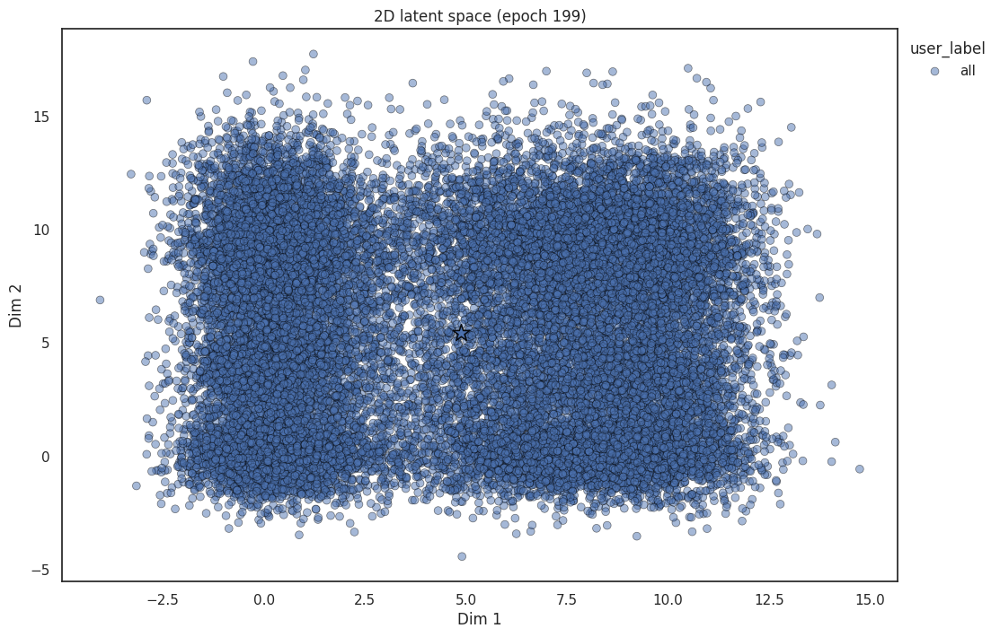

In [4]:
disent.show_result()

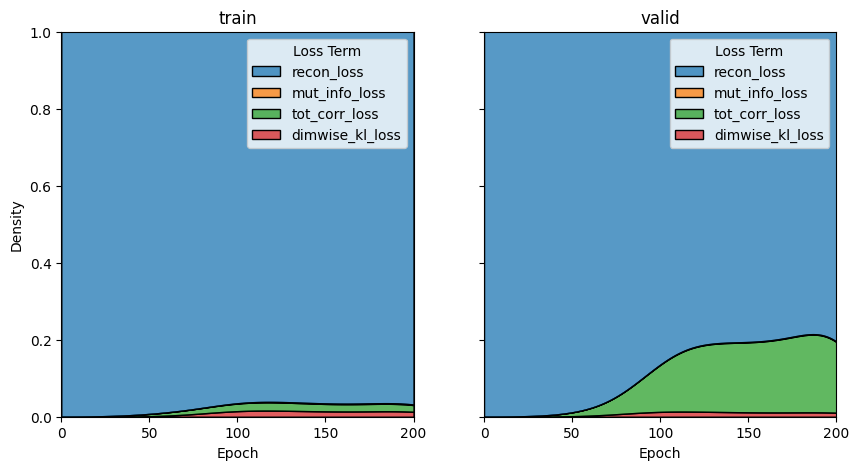

In [5]:
disent.visualizer.show_loss(plot_type="relative")

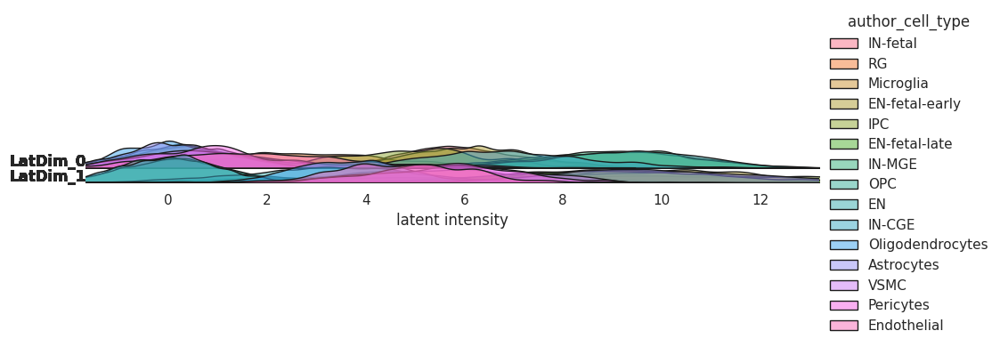

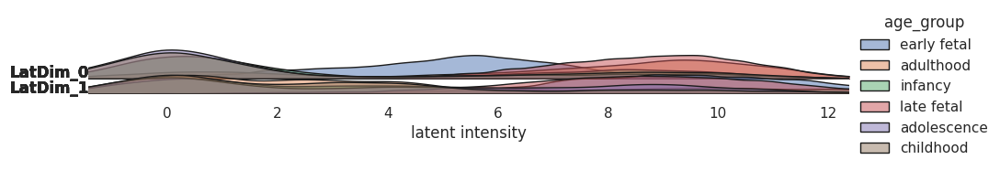

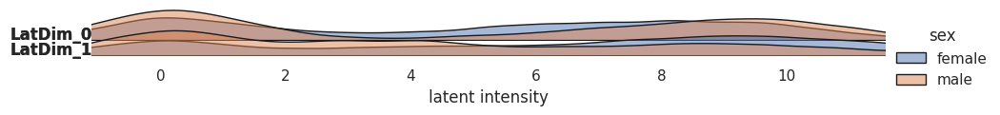

In [6]:
disent.visualizer.show_latent_space(result=disent.result, plot_type="Ridgeline", param=["author_cell_type","age_group","sex"])

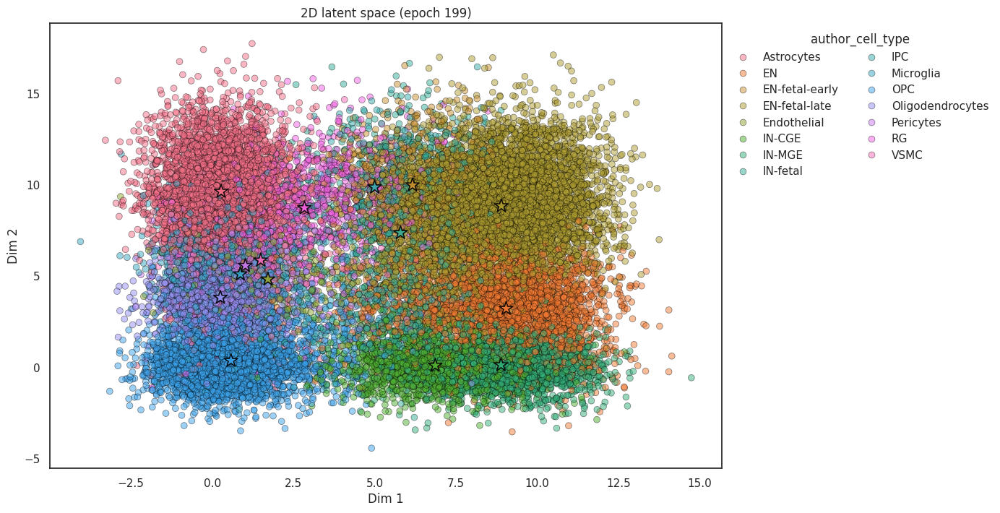

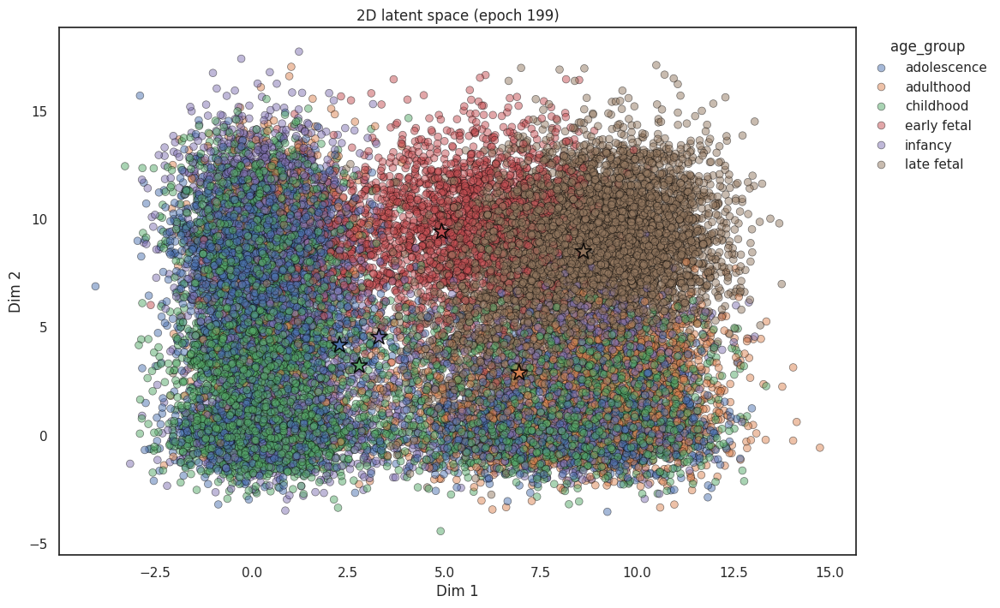

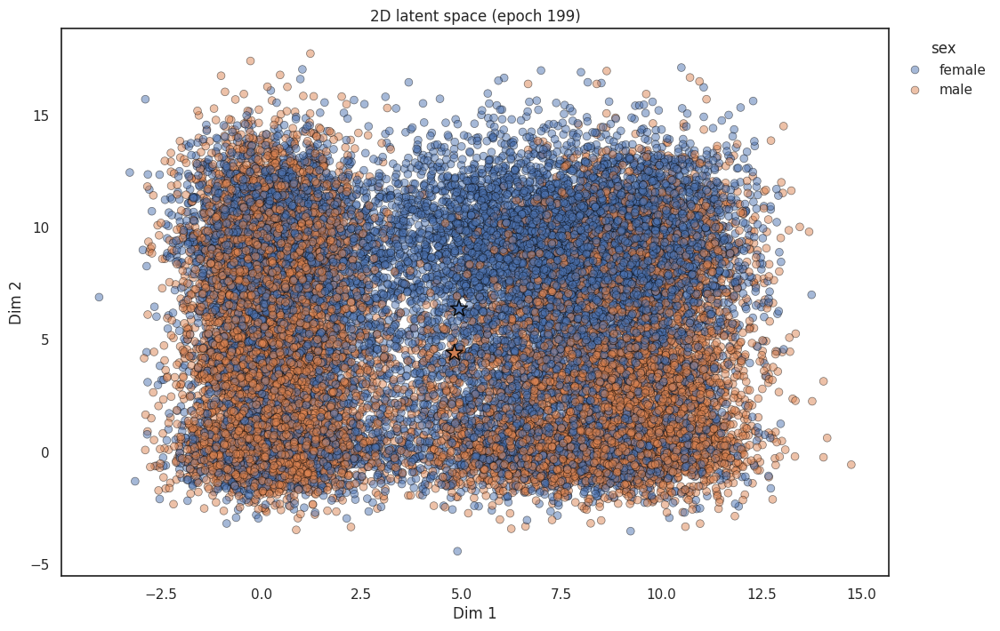

In [7]:
disent.visualizer.show_latent_space(result=disent.result, plot_type="2D-scatter", param=["author_cell_type","age_group","sex"])

## Train a Varix for comparison

/home/ewald/Github/autoencodix_package/src/autoencodix/base/_base_pipeline.py:189: UserWarning: Your config is of type: <class 'autoencodix.configs.disentanglix_config.DisentanglixConfig'>, for this pipeline the default params of: <class 'autoencodix.configs.varix_config.VarixConfig'> work best
  warnings.warn(


in handle_direct_user_data with data: <class 'autoencodix.data.datapackage.DataPackage'>
--- Running Pairing-Aware Split ---
Identified 24437 fully paired samples across all modalities.
Identified 0 samples present in at least one, but not all, modalities.
Successfully generated synchronized indices for all modalities.
cur shape: transcriptomics: (17105, 1000)
cur shape: epigenetic: (17105, 1000)
cur shape: transcriptomics: (4888, 1000)
cur shape: epigenetic: (4888, 1000)
cur shape: transcriptomics: (2444, 1000)
cur shape: epigenetic: (2444, 1000)
Training ...
Epoch 1 - Train Loss: 37073677.7188
Sub-losses: recon_loss: 37073560.5938, var_loss: 117.3256, anneal_factor: 0.0000, effective_beta_factor: 0.0000
Epoch 1 - Valid Loss: 4838196.0625
Sub-losses: recon_loss: 4838154.8125, var_loss: 41.2519, anneal_factor: 0.0000, effective_beta_factor: 0.0000
Epoch 2 - Train Loss: 33722780.5312
Sub-losses: recon_loss: 33722640.9062, var_loss: 139.7862, anneal_factor: 0.0001, effective_beta_factor:

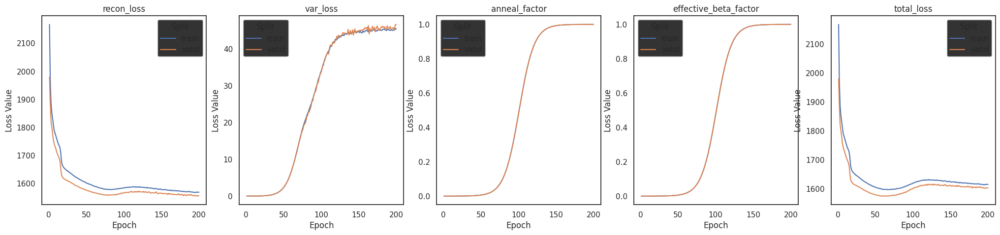

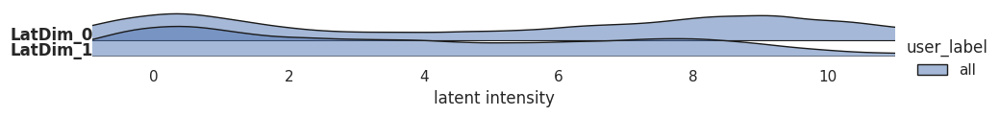

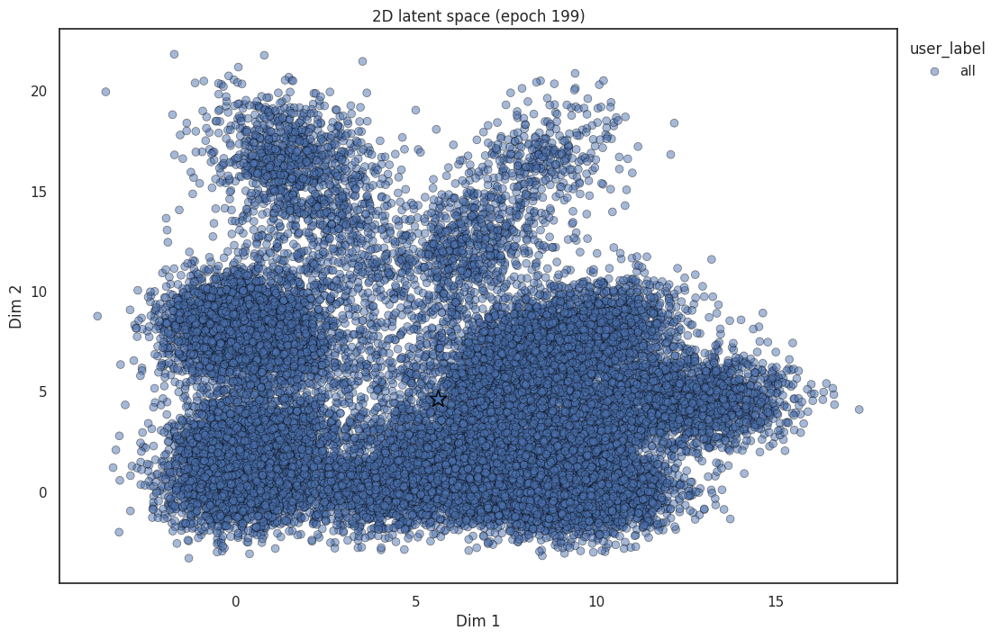

In [8]:
## Varix for comparison
my_cfg.beta = 0.1*10
varix = acx.Varix(data=data_package, config=my_cfg)
varix.run()
varix.show_result()

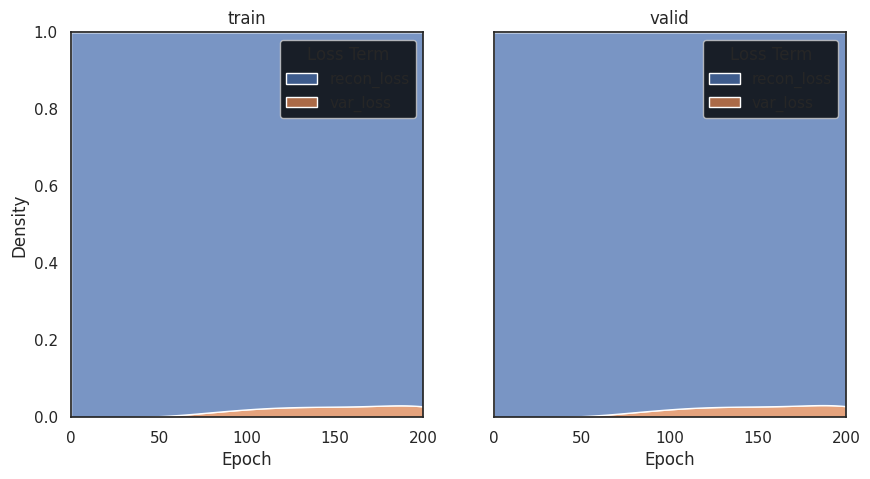

In [9]:
varix.visualizer.show_loss(plot_type="relative")

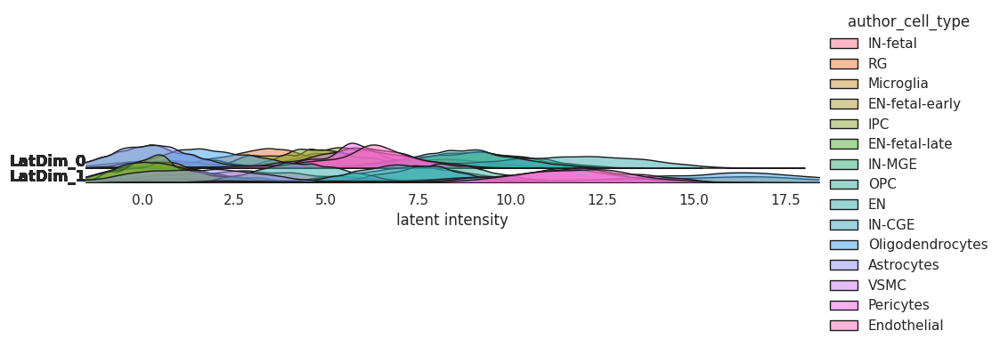

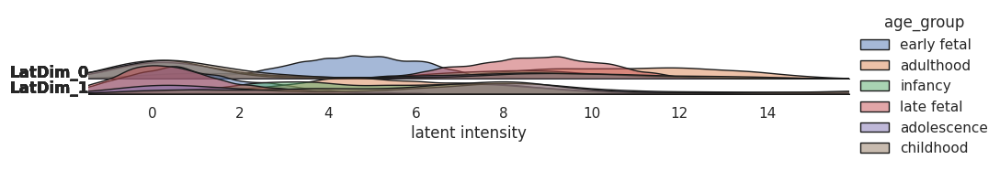

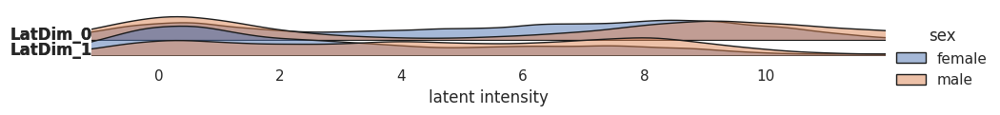

In [10]:
varix.visualizer.show_latent_space(result=varix.result, plot_type="Ridgeline", param=["author_cell_type","age_group","sex"])

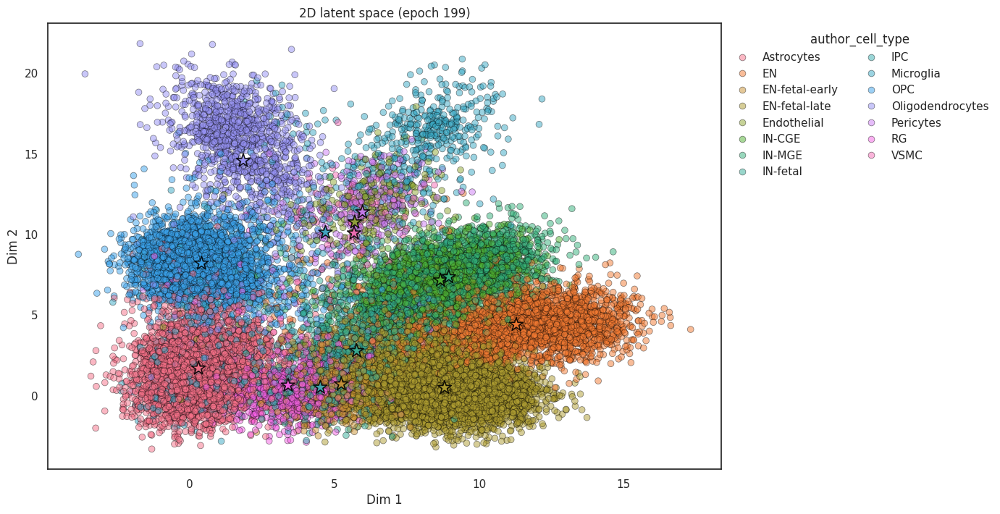

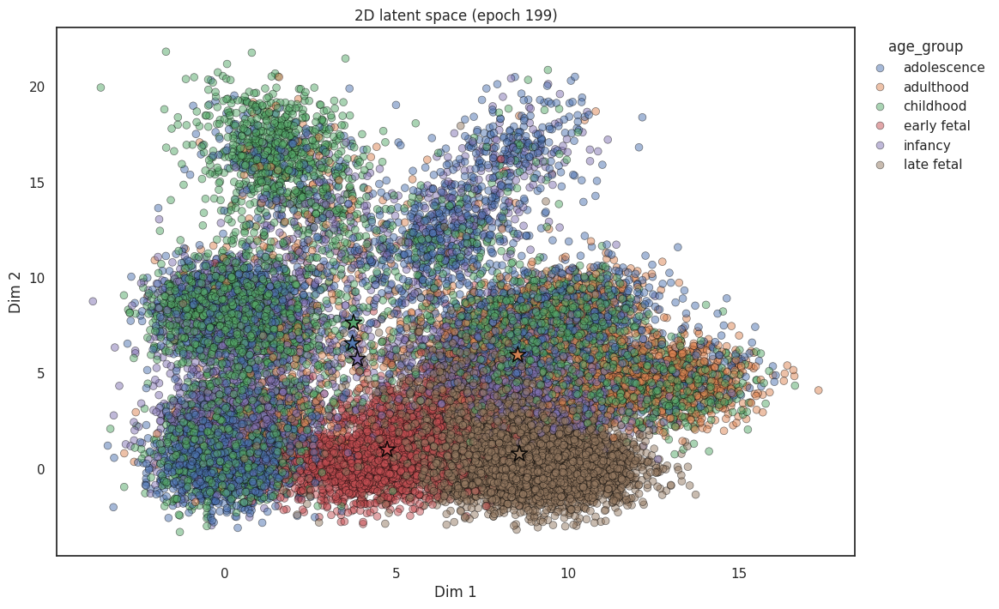

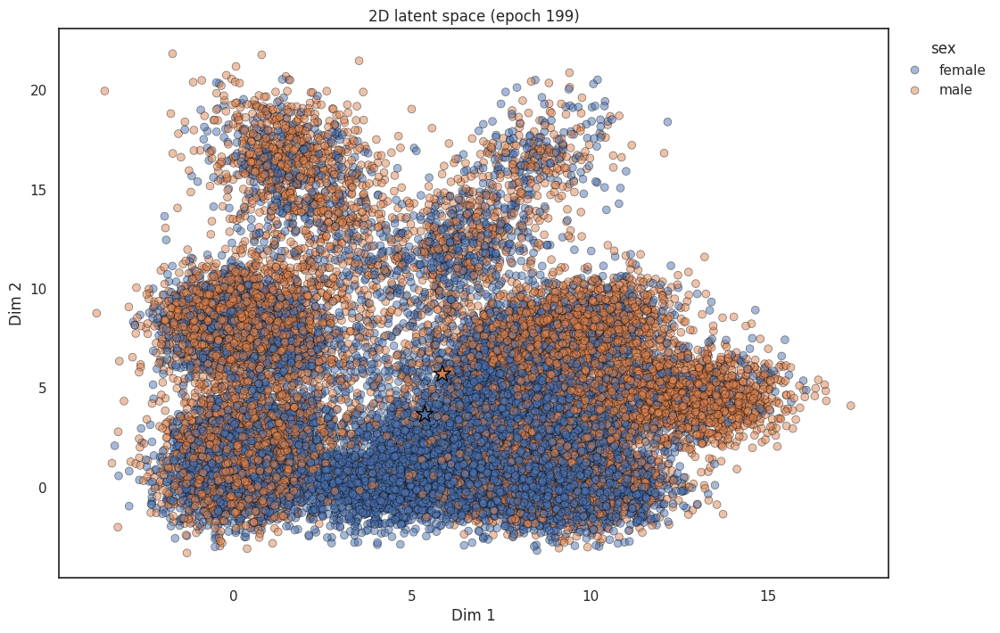

In [11]:
varix.visualizer.show_latent_space(result=varix.result, plot_type="2D-scatter", param=["author_cell_type","age_group","sex"])

## Comparison to PCA

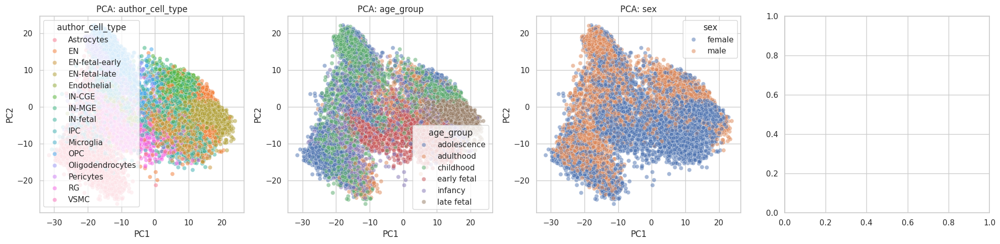

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.decomposition import PCA
sns.set(style="whitegrid")

# Prepare annotation dataframe
anno_df = pd.concat([
	disent._datasets.train.metadata['paired'],
	disent._datasets.test.metadata['paired'],
	disent._datasets.valid.metadata['paired']
])


data_df = pd.concat([
	disent._datasets.train._to_df(),
	disent._datasets.test._to_df(),
	disent._datasets.valid._to_df()
])
# Join data and annotation



pca = PCA(n_components=2)
X_pca = pca.fit_transform(data_df)

df_all = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
df_all['author_cell_type'] = anno_df.loc[data_df.index,'author_cell_type'].values
df_all['age_group'] = anno_df.loc[data_df.index,'age_group'].values
df_all['sex'] = anno_df.loc[data_df.index,'sex'].values
# tmb_groups = pd.qcut(x=anno_df.loc[data_df.index, 'TMB_NONSYNONYMOUS' ],
#                         q=4,
#                         labels=["1stQ", "2ndQ", "3rdQ", "4thQ"],
#                     ).astype(str).to_list()
# df_all['TMB_NONSYNONYMOUS'] = tmb_groups

# Plot for each parameter
params = ["author_cell_type","age_group","sex"]
fig, axes = plt.subplots(1, 4, figsize=(20, 5))
for i, param in enumerate(params):
	ax = axes[i]
	# scatter = ax.scatter(df_all['PC1'], df_all['PC2'], c=pd.factorize(df_all[param])[0], alpha=0.5, cmap='tab10')
	scatter = sns.scatterplot(x='PC1', y='PC2', hue=param, data=df_all, ax=ax, alpha=0.5)
	ax.set_title(f'PCA: {param}')
	ax.set_xlabel('PC1')
	ax.set_ylabel('PC2')
	legend_labels = df_all[param].unique()
	# ax.legend(handles=scatter.legend_elements()[0], labels=legend_labels.tolist(), title=param)
plt.tight_layout()
plt.show()

## Coverage and total correlation plot

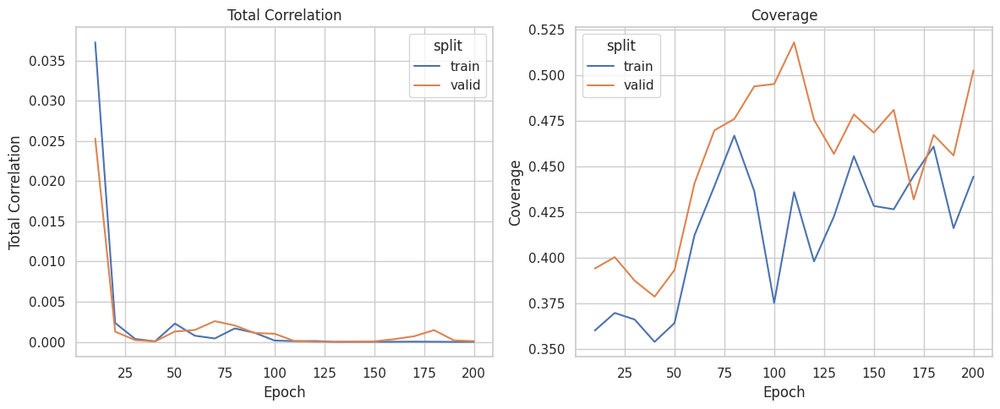

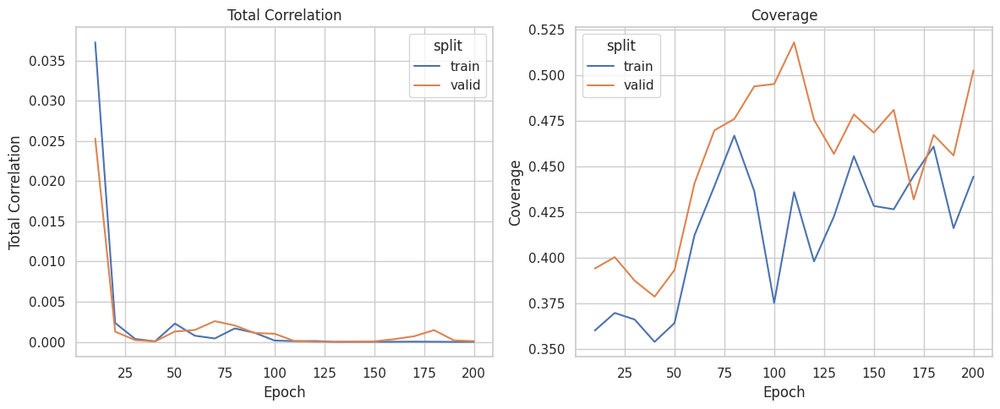

In [13]:
disent.visualizer.show_latent_space(plot_type="Coverage-Correlation", result=disent.result)

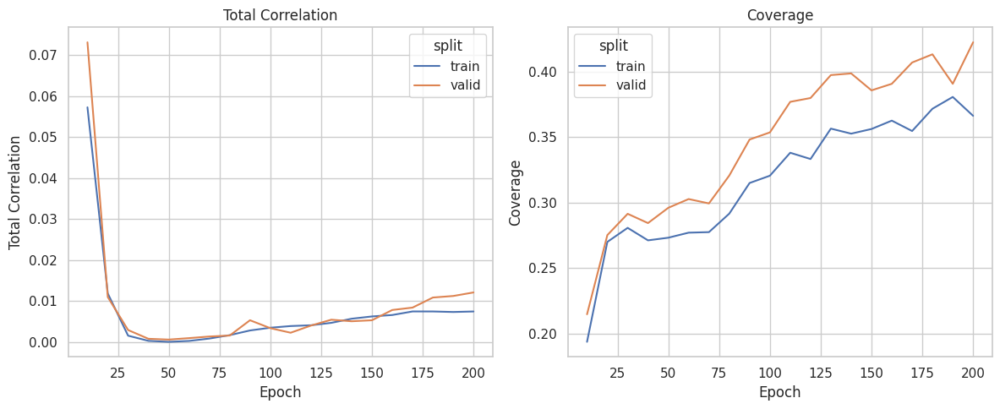

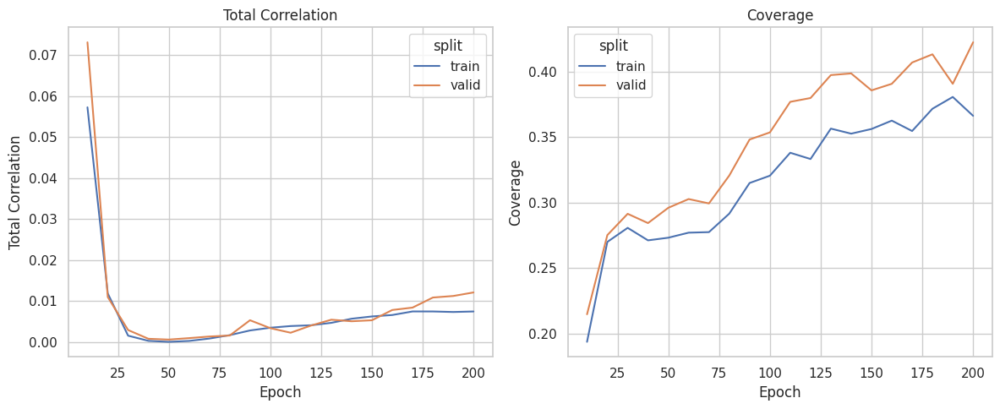

In [14]:
varix.visualizer.show_latent_space(plot_type="Coverage-Correlation", result=varix.result)